Aim of this notebook is to look at calibrated stereo images and to visualize some mathematical properties of pairs of matched keypoints, found by opencv sift algorithms or our pysift implementation.


Imports


In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "visualize_hessian"))

import visu_hessian as vh

# return to the root directory
sys.path.append(os.path.join(".."))

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "descriptor"))

import descriptor.descriptor as desc
import descriptor.visu_descriptor as visu_desc

# return to the root directory
sys.path.append(os.path.join(".."))

ModuleNotFoundError: No module named 'descriptor.descriptor'; 'descriptor' is not a package

# Load grayscale image


In [ ]:
img_folder = "../data/irl/scene_zipped"
im_name1 = "scene_l_1_u"
im_name2 = "scene_r_1_u"
im_names = [im_name1, im_name2]
im_ext = "jpeg"

ims = [
    cv.imread(f"{img_folder}/{im_names[i]}.{im_ext}", cv.IMREAD_GRAYSCALE)
    for i in range(2)
]

## Crop objects


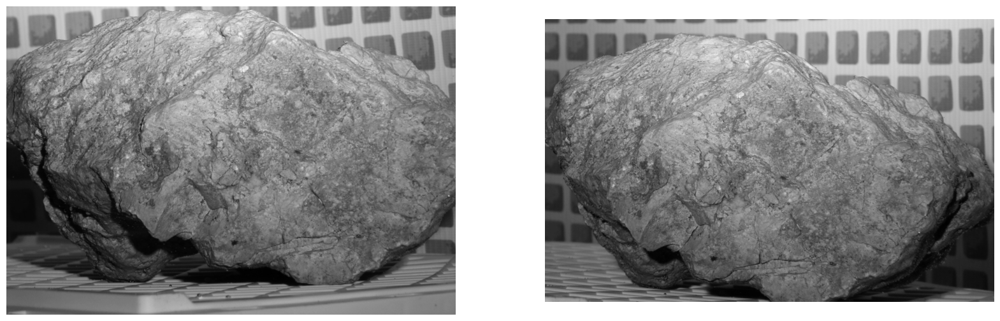

In [ ]:
croppings = [slice(500, 1400), slice(900, 2210), slice(670, 1560), slice(1090, 2500)]
ims[0] = ims[0][croppings[0], croppings[1]]
ims[1] = ims[1][croppings[2], croppings[3]]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(ims[0], cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(ims[1], cmap="gray")
plt.axis("off")
plt.show()

In [ ]:
# compute float32 versions for calculations
float_ims = [vh.convert_uint8_to_float32(ims[i]) for i in range(2)]

Blur Images


In [ ]:
float_ims = [float_ims[0], float_ims[1]]
blur_sigma = 1.0
float_ims = [desc.convolve_2D_gaussian(float_ims[i], blur_sigma) for i in range(2)]

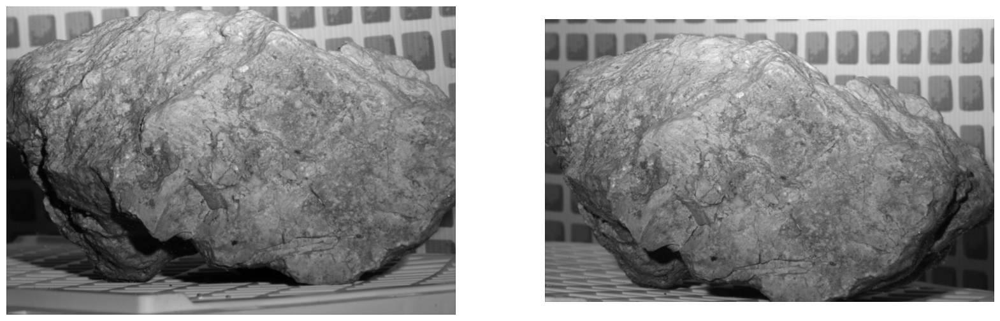

Image 1 min: 0.028366762427370535
Image 1 max: 0.8703037723049949
Image 1 mean: 0.41497924309758333
Image 1 std: 0.15502021575404915
Image 1 shape: (900, 1310)
Image 1 dtype: float64
Image 1 size: 1179000

Image 2 min: 0.045551101475235785
Image 2 max: 0.8750201116814502
Image 2 mean: 0.4337025892081276
Image 2 std: 0.15839268596621398
Image 2 shape: (890, 1410)
Image 2 dtype: float64
Image 2 size: 1254900



In [ ]:
float_ims[0], float_ims[1] = float_ims

# compute min and max values for normalization
min_val = min(float_ims[0].min(), float_ims[1].min())
max_val = max(float_ims[0].max(), float_ims[1].max())
min_vals, max_vals = [min_val, min_val], [max_val, max_val]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(float_ims[0], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(float_ims[1], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.show()

# print extrema values
for i, im in enumerate(float_ims):
    print(f"Image {i+1} min: {im.min()}")
    print(f"Image {i+1} max: {im.max()}")
    print(f"Image {i+1} mean: {im.mean()}")
    print(f"Image {i+1} std: {im.std()}")
    print(f"Image {i+1} shape: {im.shape}")
    print(f"Image {i+1} dtype: {im.dtype}")
    print(f"Image {i+1} size: {im.size}")
    print("")

# Match SIFT Keypoints on stereo setup


In [ ]:
# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kps1, des1 = sift.detectAndCompute(ims[0], None)
kps2, des2 = sift.detectAndCompute(ims[1], None)

# print number of keypoints detected in each image
print(f"Number of keypoints detected in {im_name1}: {len(kps1)}")
print(f"Number of keypoints detected in {im_name2}: {len(kps2)}")

Number of keypoints detected in scene_l_1_u: 7366
Number of keypoints detected in scene_r_1_u: 6916


In [ ]:
# BFMatcher with default params
# default norm is L2
bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test
threshold = 0.75
good = []
for m, n in matches:
    if m.distance < threshold * n.distance:
        good.append([m])

# Alternative: crossCheck=True
bf_CC = cv.BFMatcher(crossCheck=True)
matches_CC = bf_CC.match(des1, des2)

# Sort them in the order of their distance.
good_sorted = sorted(good, key=lambda x: x[0].distance)
matches_CC_sorted = sorted(matches_CC, key=lambda x: x.distance)

# print the distances
print("Distances with Lowe's ratio:")
for m in good_sorted[:10]:
    print(f"{m[0].distance:.2f}", end=" ")

print("\nDistances with crossCheck:")
for m in matches_CC_sorted[:10]:
    print(f"{m.distance:.2f}", end=" ")

Distances with Lowe's ratio:
31.11 33.81 35.14 35.71 36.36 36.37 38.57 41.36 42.77 45.35 
Distances with crossCheck:
31.11 33.81 35.14 35.71 36.36 36.37 38.57 41.36 42.77 45.35 

In [ ]:
# get the pairs of keypoints
kps1_matched = np.array([kps1[m[0].queryIdx].pt for m in good_sorted])
kps2_matched = np.array([kps2[m[0].trainIdx].pt for m in good_sorted])

# Visualize gradients and curvatures


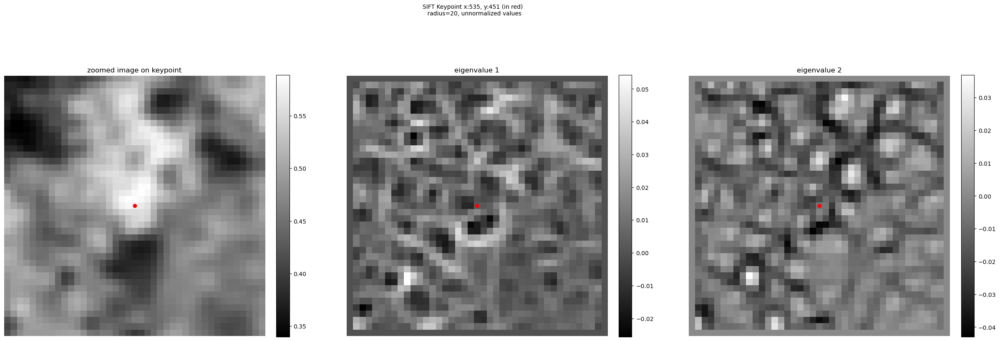

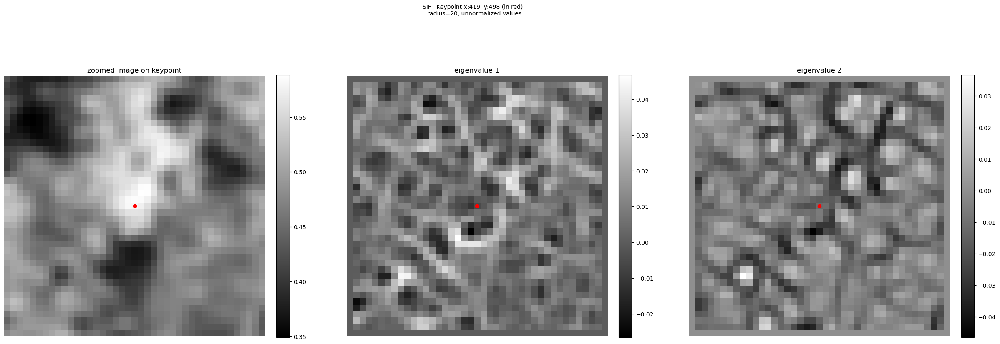

In [ ]:
# %%script false
zoom_radius = 20


# display the figure of curvature values on the float versions

eigval_fig1 = vh.visualize_curvature_values(float_ims[0], kp1, zoom_radius)

plt.figure(eigval_fig1.number)

plt.show()


eigval_fig2 = vh.visualize_curvature_values(float_ims[1], kp2, zoom_radius)

plt.figure(eigval_fig2.number)

plt.show()

Display curvature directions side by side


In [ ]:
# %%script false
dir_fig = vh.compare_directions(
    float_ims[0], float_ims[1], kp1, kp2, zoom_radius, dpi=800
)

# show figure
plt.figure(dir_fig.number)
plt.show()

Show gradients side by side²


In [ ]:
# %%script false
grad_fig = vh.compare_gradients(
    float_ims[0], float_ims[1], kp1, kp2, zoom_radius, dpi=800
)

# show figure
plt.figure(grad_fig.number)
plt.show()

### Test rotated features
